In [1]:
# calibrate the spectrometer

import numpy as np
from scipy import stats
import matplotlib.pyplot as plt

# enter the data
lambda_c = [587.6, 388.9, 706.5, 667.8, 504.7, 501.6, 492.2, 471.3, 447.1, 443.7, 438.8, 414.4, 412.1, 402.6, 396.4]   # enter the central wavelength
r_c = [257, 514, 104, 154, 364, 368, 380, 406, 438, 442, 449, 480, 483, 496, 504]        # enter the corresponding rotation angle

<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\s'
/var/folders/5q/chddvdnn39g8dvphqtky5wy00000gn/T/ipykernel_29111/2424183136.py:17: SyntaxWarning: invalid escape sequence '\s'
  plt.text(220, 490, '$\sigma$ = ' + str(round(std_err_delta_lambda_over_delta_r, 3)))


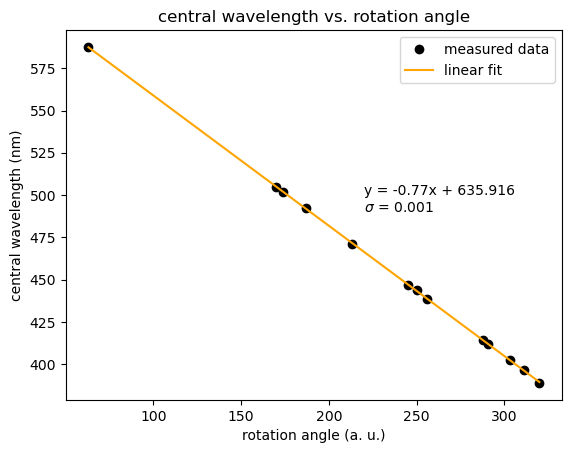

d_lambda_over_d_r =  -0.7702714443151172
b_a =  635.9156619609018
r_value =  -0.9999837311793127
p_value =  4.8921163422027154e-26
std_err =  0.0013247861786371792


In [2]:
lambda_c = [706.5, 667.8, 587.6, 504.7, 501.6, 492.2, 471.3, 447.1, 443.7, 438.8, 414.4, 412.1, 402.6, 396.4, 388.9]
r_c = [6, 58, 63, 170, 174, 187, 213, 245, 250, 256, 288, 291, 303, 311, 320]

lambda_c = [587.6, 504.7, 501.6, 492.2, 471.3, 447.1, 443.7, 438.8, 414.4, 412.1, 402.6, 396.4, 388.9]
r_c = [63, 170, 174, 187, 213, 245, 250, 256, 288, 291, 303, 311, 320]

delta_lambda_over_delta_r, b_a, r_value, p_value, std_err_delta_lambda_over_delta_r = stats.linregress(r_c, lambda_c)

# plot the data
plt.plot(r_c, lambda_c, 'o', label="measured data", color="black")
plt.plot(r_c, delta_lambda_over_delta_r * np.array(r_c) + b_a, label="linear fit", color="orange")
plt.xlabel('rotation angle (a. u.)')
plt.ylabel('central wavelength (nm)')
plt.title('central wavelength vs. rotation angle')
# write the equation of the line
plt.text(220, 500, 'y = ' + str(round(delta_lambda_over_delta_r, 3)) + 'x + ' + str(round(b_a, 3)))
plt.text(220, 490, '$\sigma$ = ' + str(round(std_err_delta_lambda_over_delta_r, 3)))
plt.legend()
plt.show()

print('d_lambda_over_d_r = ', delta_lambda_over_delta_r)
print('b_a = ', b_a)
print('r_value = ', r_value)
print('p_value = ', p_value)
print('std_err = ', std_err_delta_lambda_over_delta_r)

In [3]:
import pint

ureg = pint.UnitRegistry()

In [4]:
# this calibration defines a function that gives the central wavelength of a given rotation angle
def lambda_c(r):
    return delta_lambda_over_delta_r * r + b_a

def sigma_lambda_c(r, sigma_r):
    first_term = sigma_r * delta_lambda_over_delta_r
    second_term = std_err_delta_lambda_over_delta_r * r
    return (first_term**2 + second_term**2)**0.5

In [5]:
import os
import matplotlib.pyplot as plt

#function for reading bitmap file
def read_bmp(path_to_file):
    return plt.imread(path_to_file)

#function for extracting the value of pixel at x and y position and of a given color (0-red, 1-green, 2-blue)
def get_pixel(image,x,y,color):
    return image[x][y][color]

In [6]:
import numpy as np
from scipy.optimize import curve_fit

# Define the Gaussian function
def gaussian(x, A, mu, sigma):
    return A * np.exp(-((x - mu)**2) / (2 * sigma**2))

def fit_gaussian(x_data, y_data):
    #remove the background
    background = np.min(y_data)
    y_data = y_data - background

    peak_index = np.argmax(y_data)
    peak_x = x_data[peak_index]
    weights = np.exp(-0.5 * (x_data - peak_x)**2 / np.std(x_data)**2)

    params, pcov = curve_fit(
        gaussian, x_data, y_data,
        p0=[np.max(y_data), peak_x, np.std(x_data)],
        sigma=1./weights,  # Inverse of the weights for the sigma parameter
        absolute_sigma=False,  # Treat the sigma as relative weights
        maxfev=10000
    )

    return params[1] + background, params[2]


# average the image over the height and the color channels
def average_image(image):
    image_avg_color = np.mean(image, axis=2)
    image_avg_color_height = np.mean(image_avg_color, axis=0)
    image_avg_color_height = image_avg_color_height - np.min(image_avg_color_height)
    return image_avg_color_height

Image 01: mu = 178.94887514078704


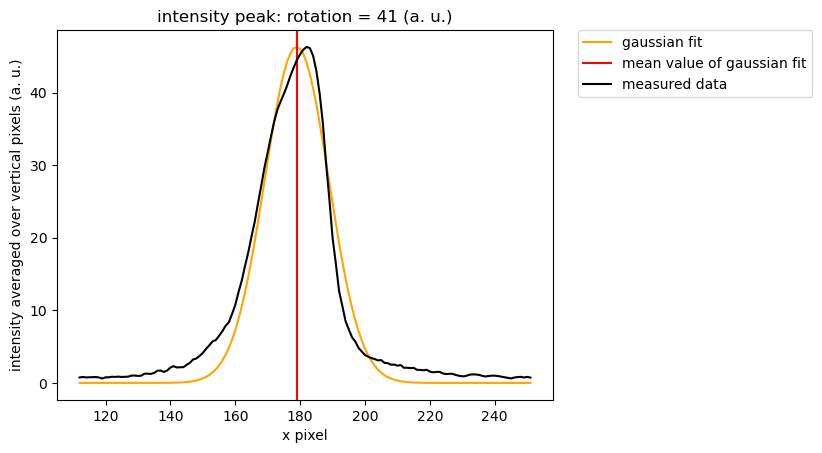

Image 02: mu = 384.4678875276087


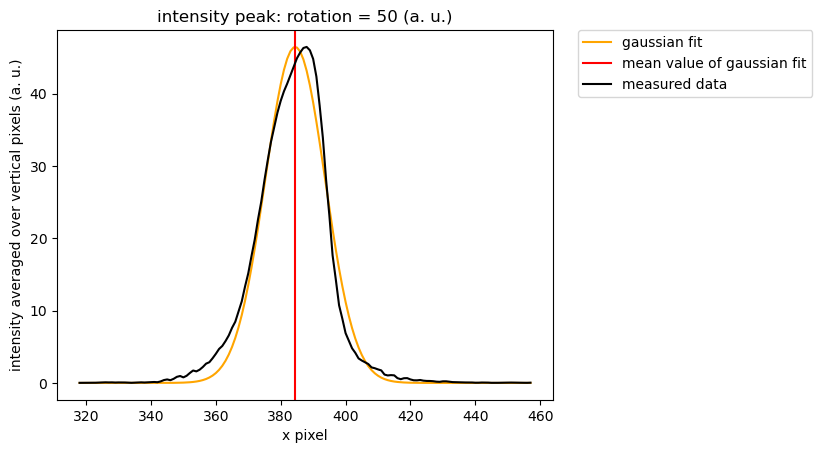

Image 03: mu = 559.9555391827794


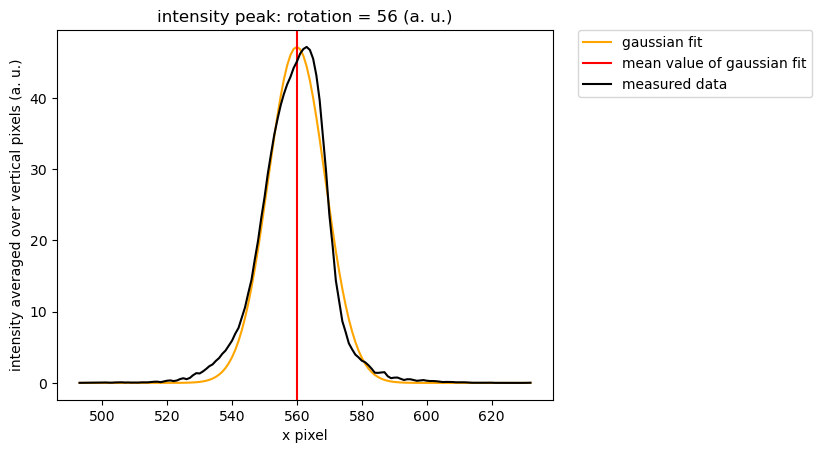

Image 04: mu = 712.0126458130674


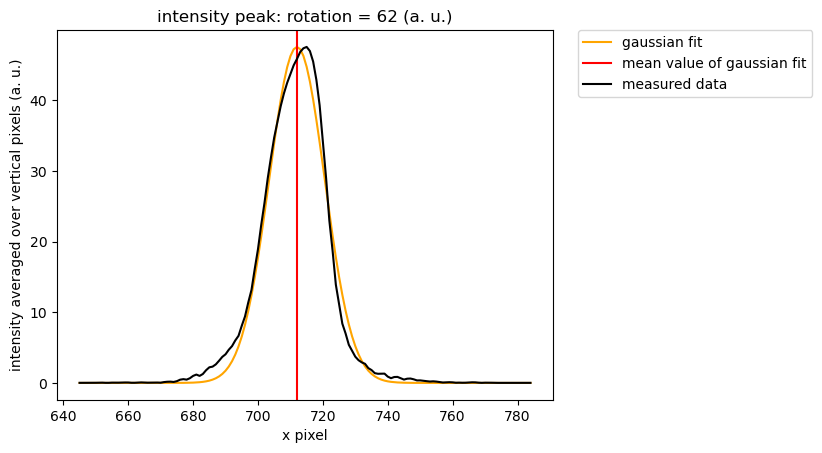

Image 05: mu = 883.6508459991478


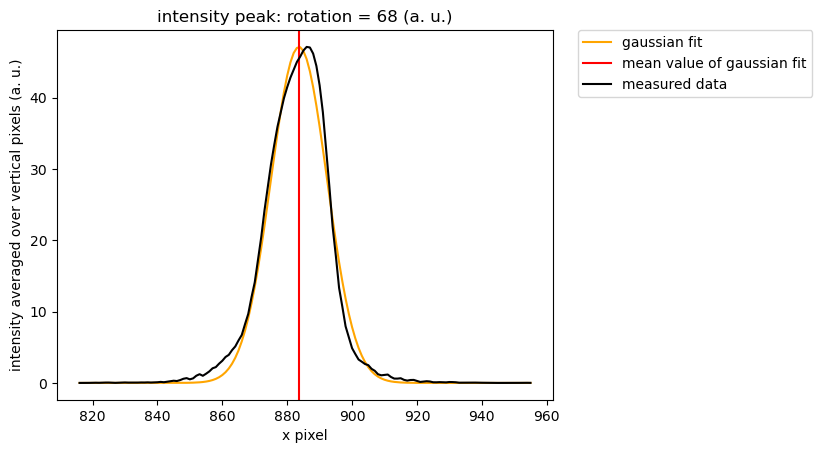

Image 06: mu = 1044.2088477733307


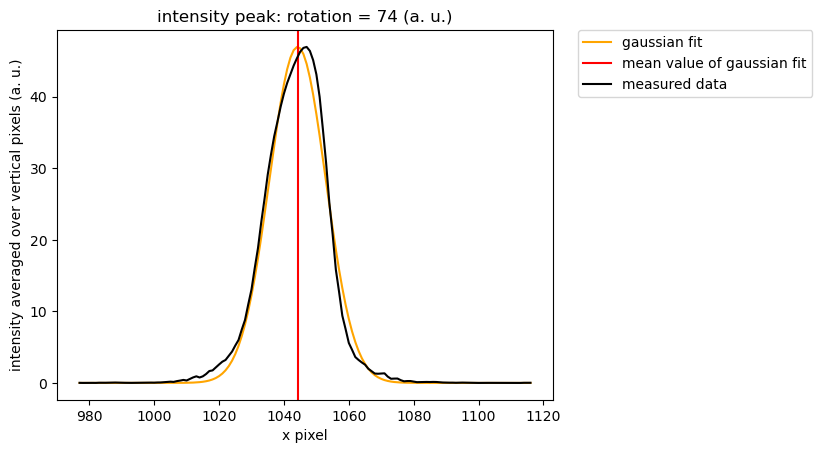

Image 07: mu = 1200.4016382070324


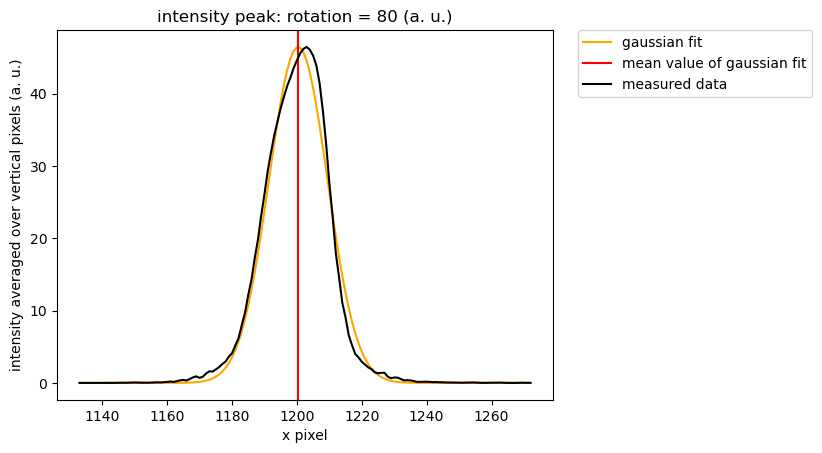

Image 08: mu = 1361.8138536701822


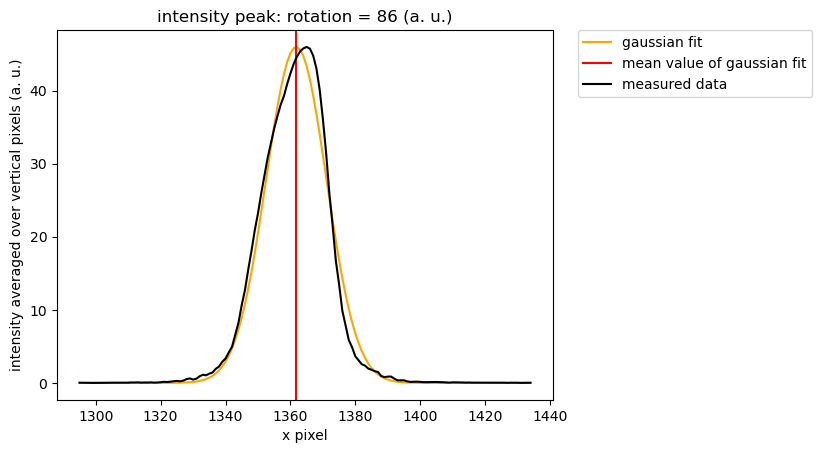

In [7]:
image_numbers = [i for i in range(1, 9)]
r_values = [41, 50, 56, 62, 68, 74, 80, 86]
mu_values = []

# choose image height to perform the fit on
isolated_peak_width = 70

for image_number in image_numbers:
    file_name = f"{image_number:02d}.bmp"
    #print(f"Processing file {file_name}")
    path = os.path.join('/Users/mreihs/Desktop/eth/praktikum_1/Spektroskopische_Messungen/b', file_name)
    image = read_bmp(path)

    # average the image over the height and the color channels
    image_avg_color_height = average_image(image)

   
    # fit gaussian to isolated peak and get the central pixel position
    max_index = np.argmax(image_avg_color_height)
    isolated_peak = image_avg_color_height[max_index - isolated_peak_width: max_index + isolated_peak_width]
    x_values = np.arange(max_index - isolated_peak_width, max_index + isolated_peak_width)
    mu, sigma = fit_gaussian(x_values, isolated_peak)
    mu_values.append(mu)

    print(f"Image {image_number:02d}: mu = {mu}")

    # plot the isolated peak and the fit and a vertical line at the central pixel position
    plt.plot(x_values, gaussian(x_values, np.max(isolated_peak), mu, sigma), label="gaussian fit", color="orange")
    plt.axvline(mu, color='red', label="mean value of gaussian fit")
    plt.plot(x_values, isolated_peak, label="measured data", color="black")
    plt.xlabel('x pixel')
    plt.ylabel('intensity averaged over vertical pixels (a. u.)')
    plt.title('intensity peak: rotation = ' + str(r_values[image_number - 1]) + " (a. u.)")
    # put legend outside of the plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.show()
    

In [8]:
# we only care about the difference between the pixel positions
#mu_values = np.array(mu_values)
#mu_values = mu_values - mu_values[0]

# similarly we only care about the difference between the rotation angles
#r_values = np.array(r_values)
#r_values = r_values - r_values[0]

<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:17: SyntaxWarning: invalid escape sequence '\s'
/var/folders/5q/chddvdnn39g8dvphqtky5wy00000gn/T/ipykernel_29111/447486114.py:17: SyntaxWarning: invalid escape sequence '\s'
  plt.text(55, 300, f"$\sigma$ = {std_err_delta_x_over_delta_r:.2f}")


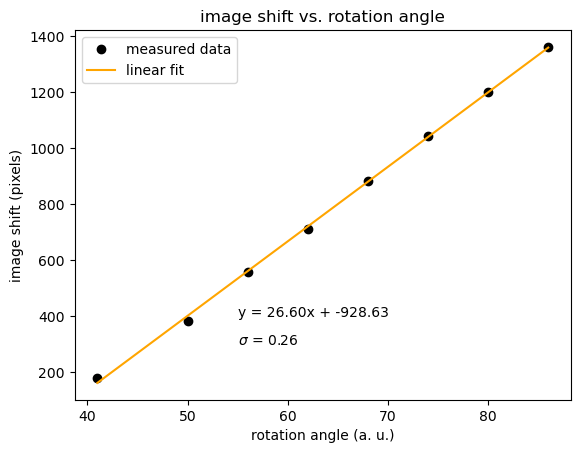

a_b =  26.60442993043349
b_b =  -928.6287675900223
r_value =  0.9997046234497586
p_value =  6.441274914946415e-11
std_err =  0.2640447665023763
Rotation by one unit corresponds to an image shift of -928.6287675900223 pixels


In [9]:
import numpy as np
from scipy import stats

# fit a linear function to the data
delta_x_over_delta_r, b_b, r_value, p_value, std_err_delta_x_over_delta_r = stats.linregress(r_values, mu_values)

# plot the data

plt.xlabel('rotation angle (a. u.)')
plt.ylabel('image shift (pixels)')
plt.title('image shift vs. rotation angle')
plt.plot(r_values, mu_values, 'o', label="measured data", color="black")
plt.plot(r_values, delta_x_over_delta_r * np.array(r_values) + b_b, label="linear fit", color="orange")
# write the equation of the line
plt.text(55, 400, f"y = {delta_x_over_delta_r:.2f}x + {b_b:.2f}")
# write the error of the slope
plt.text(55, 300, f"$\sigma$ = {std_err_delta_x_over_delta_r:.2f}")
plt.legend()
plt.show()

print('a_b = ', delta_x_over_delta_r)
print('b_b = ', b_b)
print('r_value = ', r_value)
print('p_value = ', p_value)
print('std_err = ', std_err_delta_x_over_delta_r)

# rotation by one unit corresponds to an image shift of a * 1 + b
print("Rotation by one unit corresponds to an image shift of", b_b, "pixels")

In [10]:
# we define a function that gives the rotation angle for a given image shift
def angle_for_shift(x):
    return x / delta_x_over_delta_r

def sigma_angle_for_shift(x, sigma_x):
    first_term = sigma_x / delta_x_over_delta_r
    second_term = x * std_err_delta_x_over_delta_r / delta_x_over_delta_r**2
    return (first_term**2 + second_term**2)**0.5

In [11]:
# we want a function that gives the wavelength for a given pixel position and rotation angle
def lambda_(x, r, image):
    # image is the averaged image over the height and the color channels (image_avg_color_height)
    # we first need to find the rotation angle required to shift the peak to the center
    image_width = image.shape[0]
    center = image_width / 2
    shift = center - x
    r_shift = angle_for_shift(shift)

    # the central rotation angle of the pixel x is r + r_shift
    r_c = r + r_shift

    # we then need to find the wavelength corresponding to this rotation angle r_c
    return lambda_c(r_c)

In [12]:
def sigma_lambda(r, image, x, slope_1, slope_2, sigma_slope_1, sigma_slope_2, sigma_r, sigma_b, sigma_x):
    center = image.shape[0] / 2
    term1 = ((r + (center - x) / slope_2) * sigma_slope_1) ** 2
    term2 = ((-slope_1 * (center - x) / slope_2**2) * sigma_slope_2) ** 2
    term3 = (slope_1 * sigma_r) ** 2
    term4 = sigma_b ** 2
    term5 = ((-slope_1 / slope_2) * sigma_x) ** 2

    return (term1 + term2 + term3 + term4 + term5)**0.5

In [13]:
r_values = [66, 112, 160, 206, 252, 298, 344, 390, 436]

r_values = [68, 114, 160, 206, 252, 298, 344, 390, 436]

r_values = [68, 114, 160, 206, 252, 298, 344, 390, 436]

r_values = [68, 114, 160, 206, 252, 298, 344, 390, 436]

In [14]:
# average the image over the height
def average_image_normal(image):
    image_avg_color_height = np.mean(image, axis=0)
    return image_avg_color_height

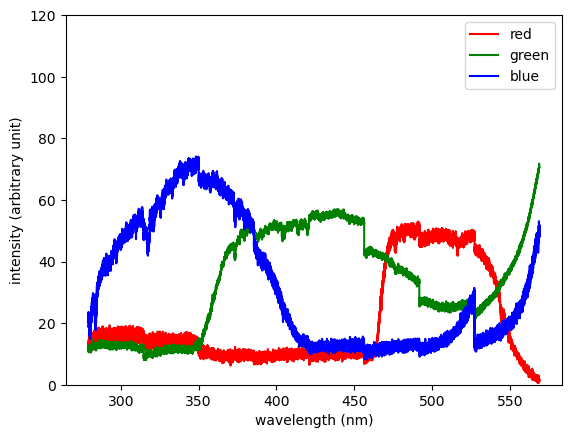

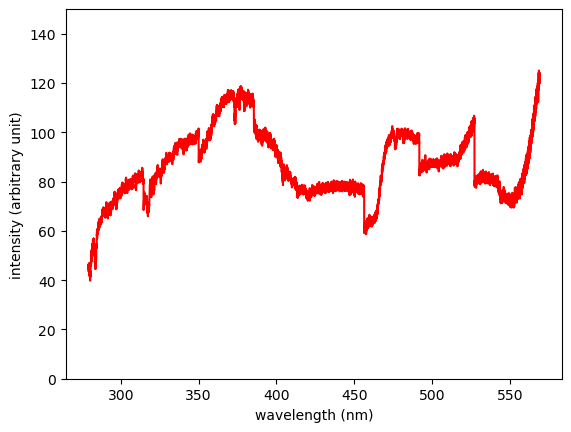

279.23133127479673 568.9217455223526


In [15]:
from scipy.ndimage import gaussian_filter

r_values = [68, 114, 160, 206, 252, 298, 344, 390, 436]

messung = 3


first_image = read_bmp('/Users/mreihs/Desktop/eth/praktikum_1/Spektroskopische_Messungen/c' + str(messung) +'/01.bmp')
first_image_avg = average_image_normal(first_image)
full_image = first_image_avg

lambda_full = lambda_(np.arange(len(first_image_avg)), r_values[1], first_image_avg)

for image_num in range(1, 8):
    image_name_right = f"{image_num:02d}.bmp"
    image_name_left = f"{(image_num + 1):02d}.bmp"
    
    path_right = os.path.join('/Users/mreihs/Desktop/eth/praktikum_1/Spektroskopische_Messungen/c' + str(messung), image_name_right)
    path_left = os.path.join('/Users/mreihs/Desktop/eth/praktikum_1/Spektroskopische_Messungen/c' + str(messung), image_name_left)
    
    image_right = read_bmp(path_right)
    image_left = read_bmp(path_left)

    image_right_avg = average_image_normal(image_right)
    image_left_avg = average_image_normal(image_left)

    # wavelengths corresponding to the pixel positions
    lambda_right = lambda_(np.arange(len(image_right_avg)), r_values[image_num], image_right_avg)
    lambda_left = lambda_(np.arange(len(image_left_avg)), r_values[image_num + 1], image_left_avg)

    lambda_right_lim = lambda_right[0]

    # find the closts wavelength in the left image to lambda_right_lim
    diff_lambda_left = np.abs(lambda_left - lambda_right_lim)
    optimal_shift = np.argmin(diff_lambda_left)

    # prepend the left image until the optimal shift to the full image
    full_image = np.concatenate((image_left_avg[:optimal_shift], full_image), axis=0)
    lambda_full = np.concatenate((lambda_left[:optimal_shift], lambda_full), axis=0)

plt.plot(lambda_full, full_image[:, 0], label='red', color='red')
plt.plot(lambda_full, full_image[:, 1], label='green', color='green')
plt.plot(lambda_full, full_image[:, 2], label='blue', color='blue')
plt.xlabel('wavelength (nm)')
plt.ylabel('intensity (arbitrary unit)')
plt.ylim(0, 120)
plt.legend()
plt.show()

# plot abslute intensity
intensity = full_image[:, 0] + full_image[:, 1] + full_image[:, 2]
plt.plot(lambda_full, intensity, color='red')
plt.xlabel('wavelength (nm)')
plt.ylabel('intensity (arbitrary unit)')
plt.ylim(0, 150)
plt.show()

print(lambda_full[0], lambda_full[-1])

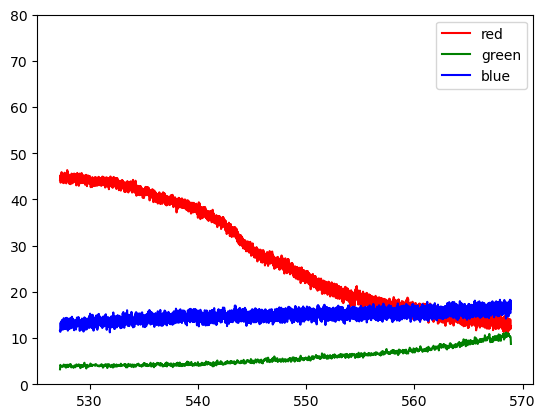

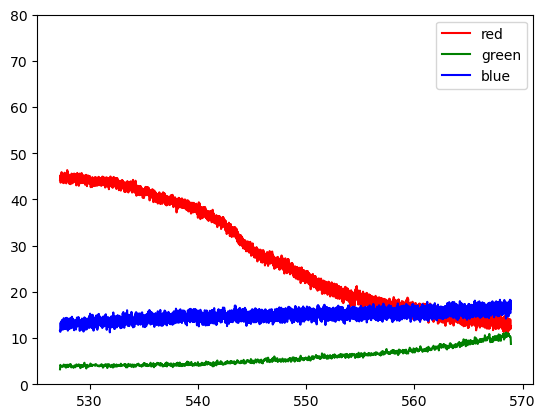

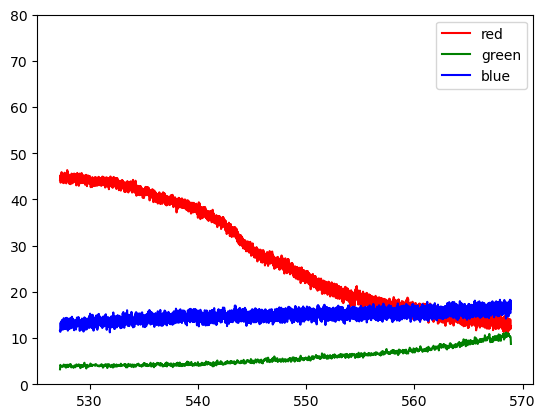

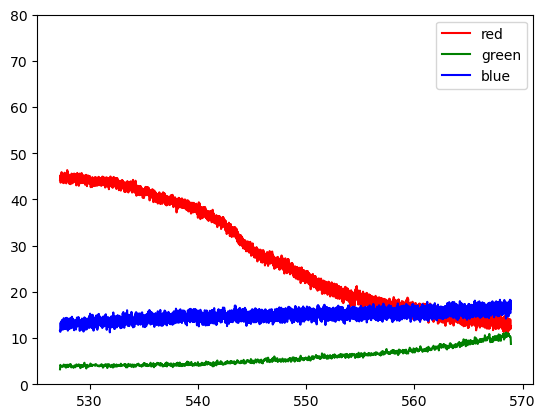

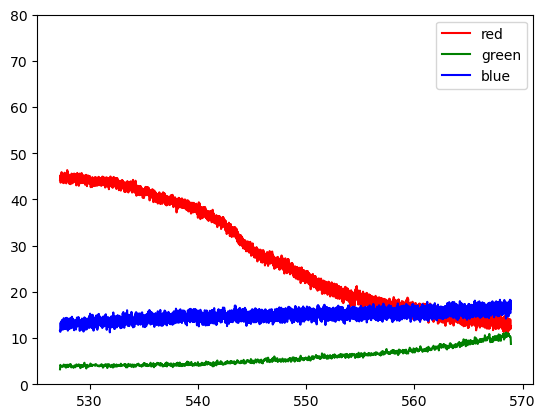

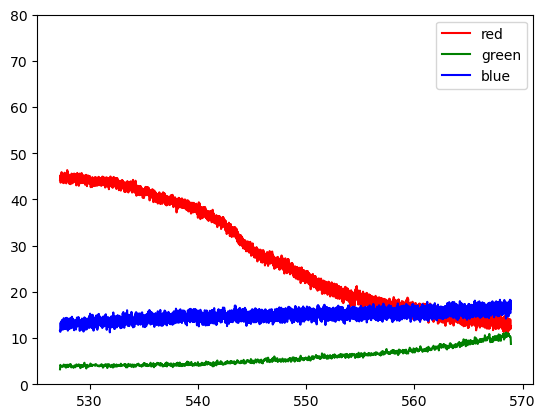

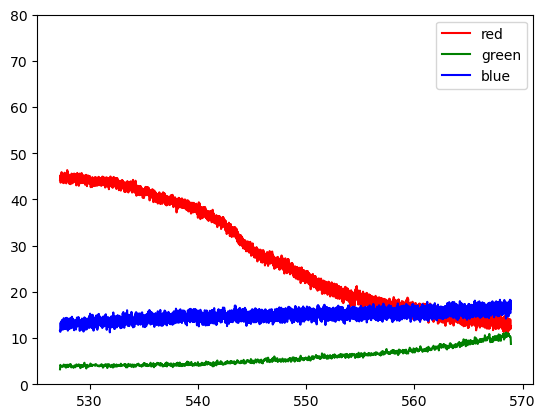

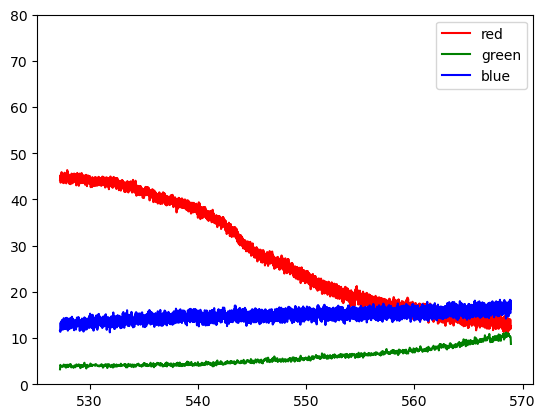

In [16]:
from scipy.ndimage import gaussian_filter

r_values = [68, 114, 160, 206, 252, 298, 344, 390, 436]

messung = 1


first_image = read_bmp('/Users/mreihs/Desktop/eth/praktikum_1/Spektroskopische_Messungen/c' + str(messung) +'/01.bmp')
first_image_avg = average_image_normal(first_image)
full_image = first_image_avg

lambda_full = lambda_(np.arange(len(first_image_avg)), r_values[1], first_image_avg)

for image_num in range(1, 9):
    image_name_right = f"{image_num:02d}.bmp"
    
    path_right = os.path.join('/Users/mreihs/Desktop/eth/praktikum_1/Spektroskopische_Messungen/c' + str(messung), image_name_right)

    plt.plot(lambda_full, first_image_avg[:, 0], label='red', color='red')
    plt.plot(lambda_full, first_image_avg[:, 1], label='green', color='green')
    plt.plot(lambda_full, first_image_avg[:, 2], label='blue', color='blue')
    plt.ylim(0, 80)
    plt.legend()
    plt.show()

In [17]:
for r in r_values:
    print(lambda_c(r))

583.5372037474739
548.1047173089785
512.6722308704831
477.2397444319877
441.80725799349227
406.3747715549969
370.9422851165015
335.5097986780061
300.0773122395108


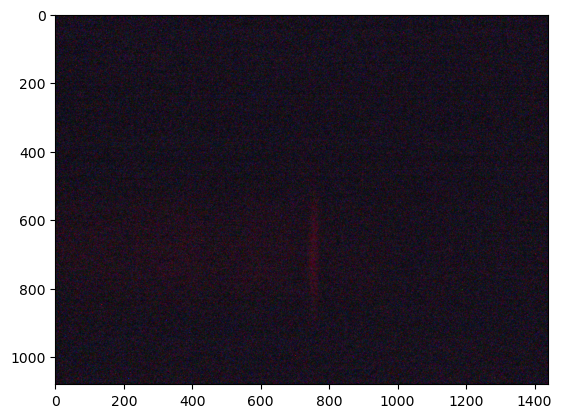

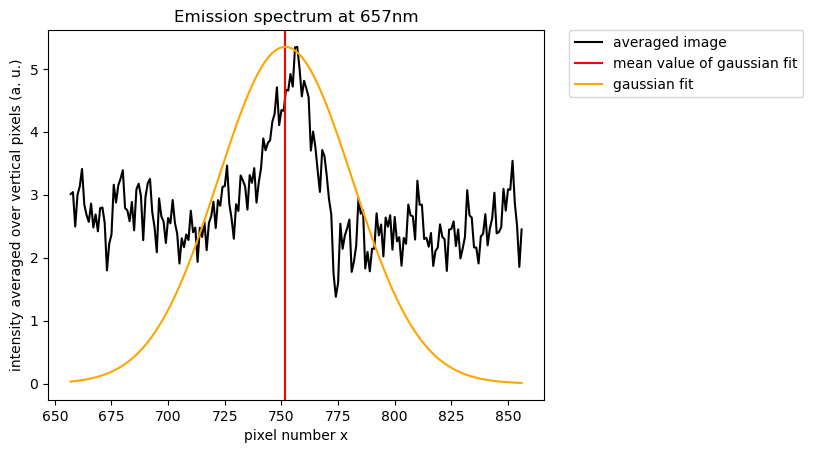

[32.74166667 16.70092593 27.72037037]
Image 01: mu = 751.663320058879
Image 01: lambda = 656.8594597453547
Image 01: error = 0.858199505840048
Image 01: fwhm = 69.80011589447898
Image 01: sigma_lambda = 0.03715245762536747
Image 01: total error = 0.8590033160190403


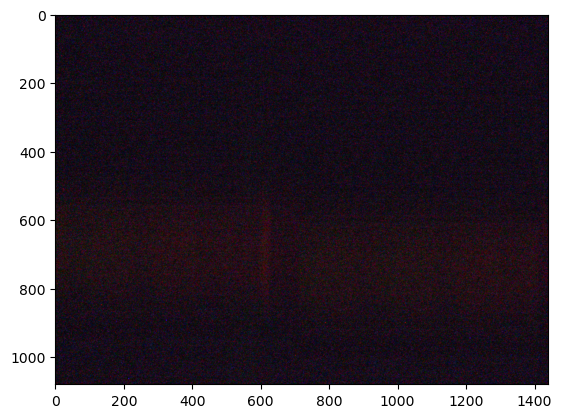

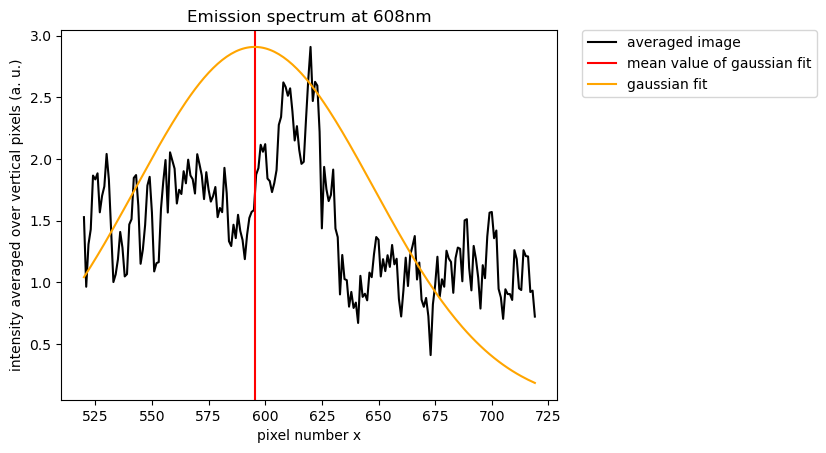

[ 27.94074074  12.98240741  22.80833333 255.        ]
Image 02: mu = 595.3474350676564
Image 02: lambda = 607.6579410264536
Image 02: error = 1.5217368965335254
Image 02: fwhm = 123.7677381729341
Image 02: sigma_lambda = 0.0603738266195051
Image 02: total error = 1.522934069883581


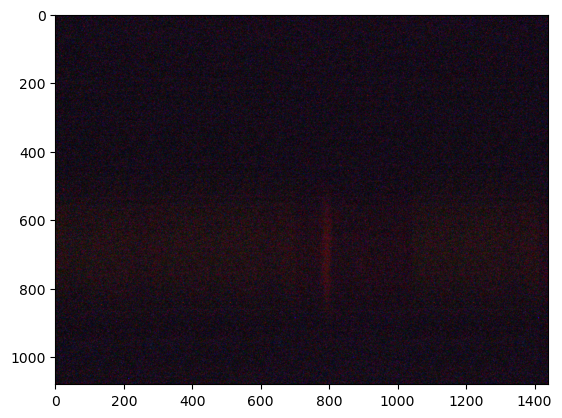

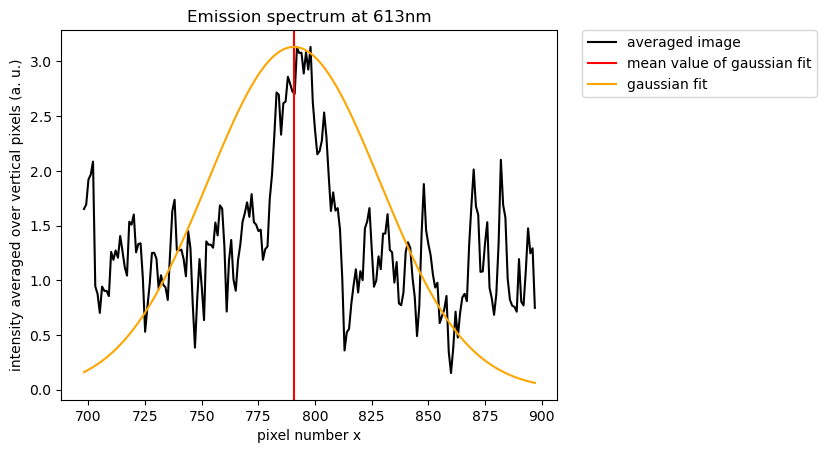

[ 29.01018519  13.34074074  25.94444444 255.        ]
Image 03: mu = 790.6189196504174
Image 03: lambda = 613.3115877633477
Image 03: error = 1.1007747038770503
Image 03: fwhm = 89.52953407858698
Image 03: sigma_lambda = 0.04385403821500721
Image 03: total error = 1.1016479135201824


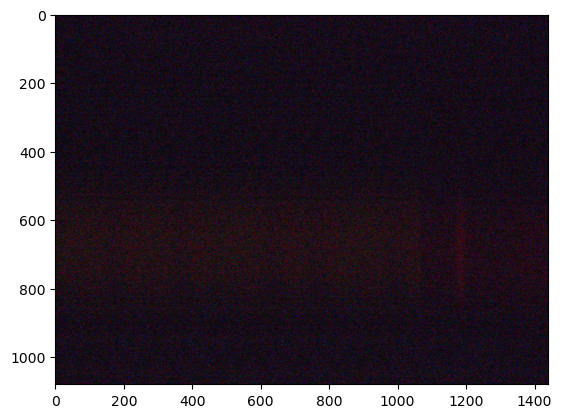

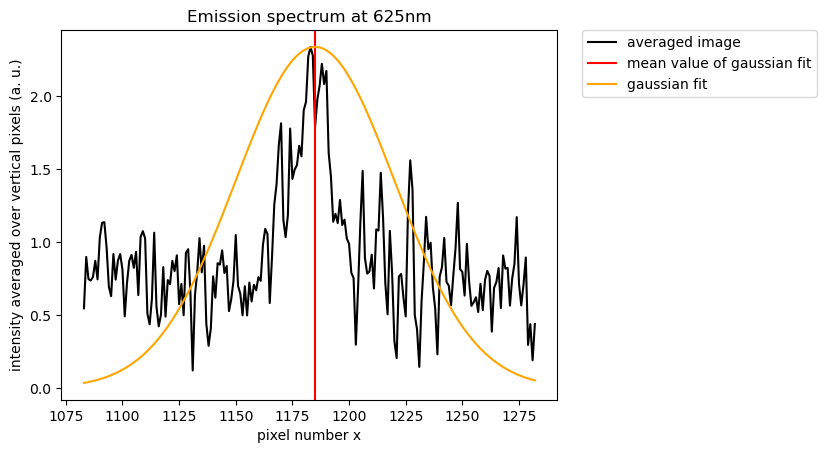

[ 31.70462963  11.33796296  22.08055556 255.        ]
Image 04: mu = 1185.0069175928022
Image 04: lambda = 624.7302053992069
Image 04: error = 1.016485584554971
Image 04: fwhm = 82.67402990119054
Image 04: sigma_lambda = 0.13499819410291466
Image 04: total error = 1.0254108718065698


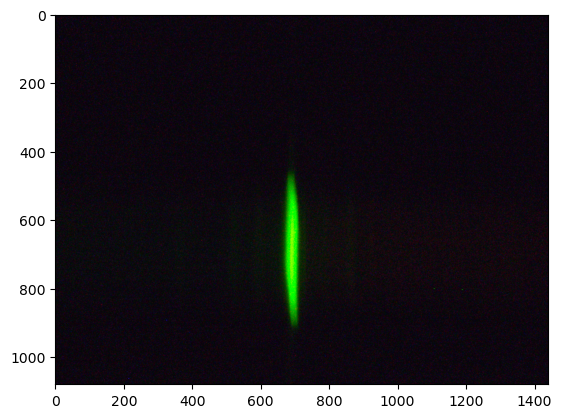

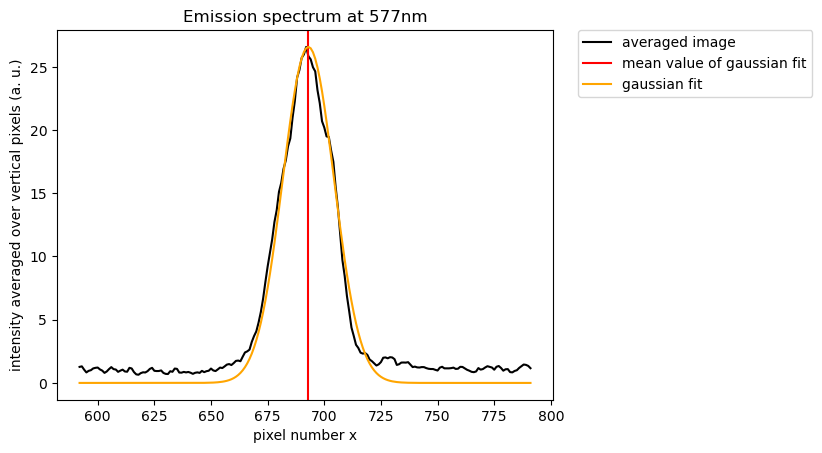

[ 34.21018519  95.80092593   9.52314815 255.        ]
Image 05: mu = 692.9809675128987
Image 05: lambda = 576.5927568639097
Image 05: error = 0.32750378336561425
Image 05: fwhm = 26.636932180974537
Image 05: sigma_lambda = 0.10232415586464307
Image 05: total error = 0.34311654141443393


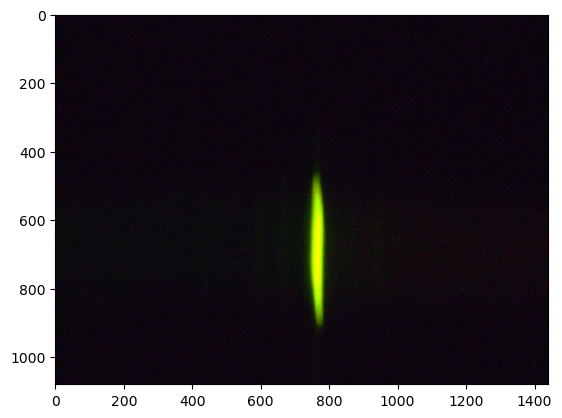

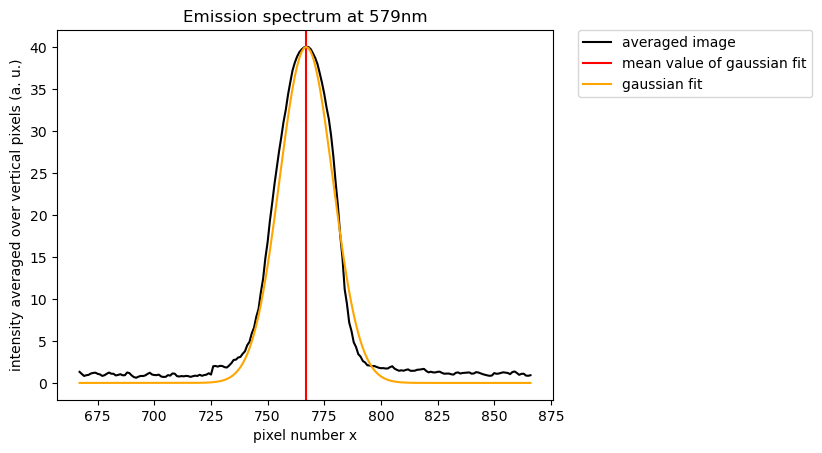

[ 87.84722222  97.15092593   8.33611111 255.        ]
Image 06: mu = 767.0307788862042
Image 06: lambda = 578.7367026393661
Image 06: error = 0.34000431752076565
Image 06: fwhm = 27.653640681537915
Image 06: sigma_lambda = 0.09926606378324666
Image 06: total error = 0.35419865520888305


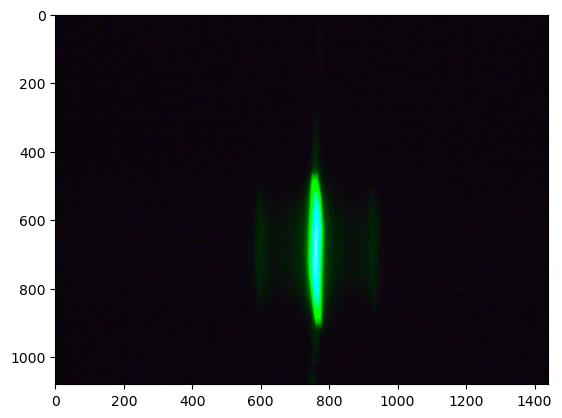

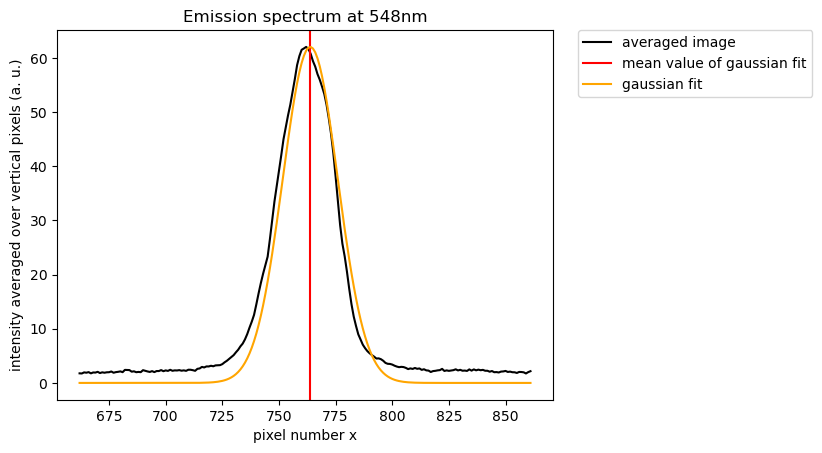

[ 18.06666667 112.54907407  80.08981481]
Image 07: mu = 763.8138147334962
Image 07: lambda = 547.8327049035788
Image 07: error = 0.3519897769367617
Image 07: fwhm = 28.628456503017905
Image 07: sigma_lambda = 0.15201570572655035
Image 07: total error = 0.3834130642734183


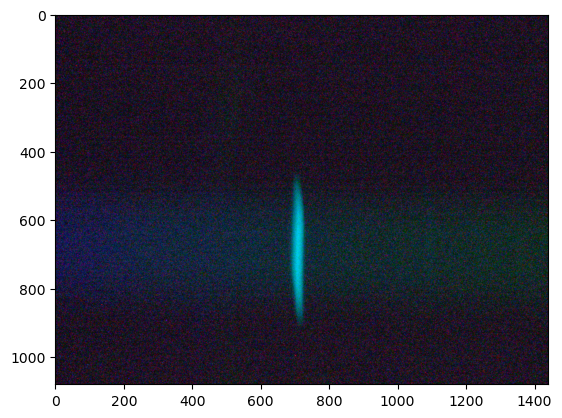

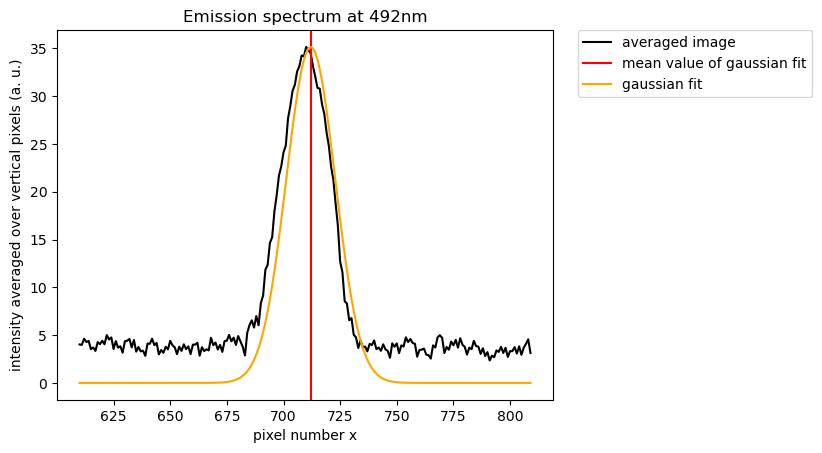

[19.975      71.86018519 91.97685185]
Image 08: mu = 712.0149926684289
Image 08: lambda = 492.41398538657194
Image 08: error = 0.31290080694094513
Image 08: fwhm = 25.449225313383632
Image 08: sigma_lambda = 0.24681851369631752
Image 08: total error = 0.39853016659665036


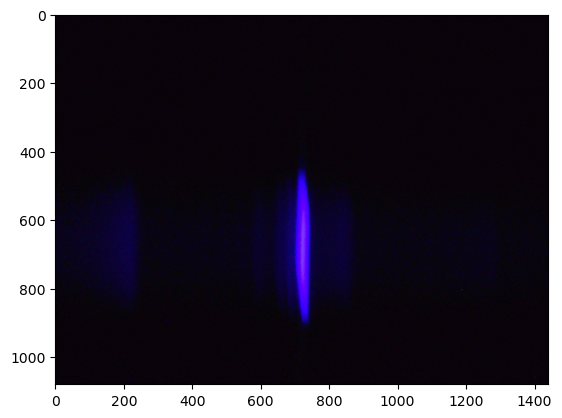

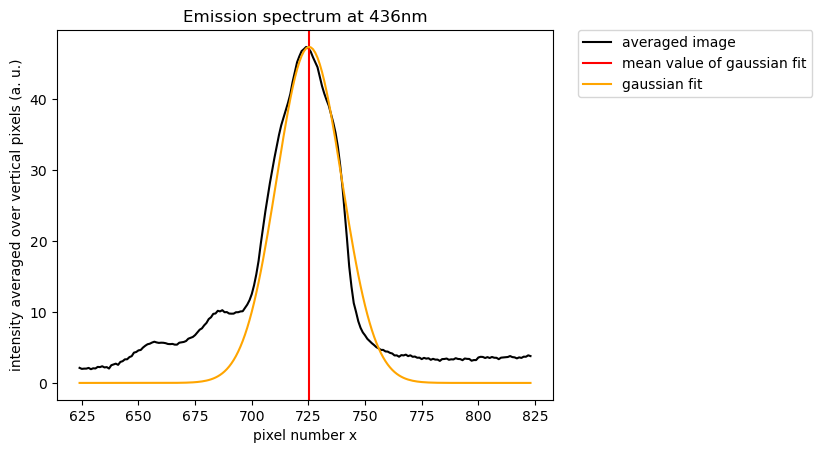

[ 44.05740741  10.54537037 108.83148148]
Image 09: mu = 725.3388046295298
Image 09: lambda = 435.79965952186234
Image 09: error = 0.41642760072471674
Image 09: fwhm = 33.869391201520365
Image 09: sigma_lambda = 0.3441819759376844
Image 09: total error = 0.5402528844955045


In [18]:
# data from hydrogen spectrum
image_numbers = [i for i in range(1, 10)]

angles = [-26, 32, 76, 116, 186, 260, 310]
# including images that werde duplicated due to multiple peaks in one image
angles = [-26, 32, 32, 32, 76, 76, 116, 186, 260, 310, 310]

# we exclude image number 3 because we cannot find the peak algorithmically
#image_numbers = [1, 2, 4]
#angles = [384, 454, 174]

mu_values_h = []
lambda_values_h = []
sigma_lambda_values_h = []
fwhm_values_h = []

isolated_peak_width = 100


for angle, image_number in zip(angles, image_numbers):
    file_name = f"{image_number:02d}.bmp"
    #print(f"Processing file {file_name}")
    path = os.path.join('/Users/mreihs/Desktop/eth/praktikum_1/Spektroskopische_Messungen/d_edited', file_name)
    image = read_bmp(path)

    plt.imshow(image)
    plt.show()

    # average the image over the height and the color channels and remove the background
    image_avg_color_height = average_image(image)

    # fit gaussian to isolated peak and get the central pixel position
    max_index = np.argmax(image_avg_color_height)
    isolated_peak = image_avg_color_height[max_index - isolated_peak_width: max_index + isolated_peak_width]
    x_values = np.arange(max_index - isolated_peak_width, max_index + isolated_peak_width)
    mu, sigma = fit_gaussian(x_values, isolated_peak)



    mu_values_h.append(mu)

    # calculate the wavelength
    lambda_value = lambda_(mu, angle, image_avg_color_height)

    # for the error calculation we need to find the minimum wavelength
    lambda_value_min = lambda_(mu - sigma, angle, image_avg_color_height)



    lambda_values_h.append(lambda_value)

    # calculate the error of the wavelength
    sigma_lambda_value = sigma_lambda(angle, image_avg_color_height, mu, delta_lambda_over_delta_r, delta_x_over_delta_r, std_err_delta_lambda_over_delta_r, std_err_delta_x_over_delta_r, 0, 0, 0)
    sigma_lambda_values_h.append(sigma_lambda_value)

    # calculate the fwhm
    fwhm = 2 * np.sqrt(2 * np.log(2)) * sigma
    fwhm_values_h.append(fwhm)

    # plot isolated_peak and draw a vertical line at mu
    # plot the gaussian fit as well
    plt.plot(x_values, isolated_peak, label="averaged image", color="black")
    plt.axvline(mu, color='red', label="mean value of gaussian fit")
    #plot gaussian fit
    plt.plot(x_values, gaussian(x_values, np.max(isolated_peak), mu, sigma), label="gaussian fit", color="orange")
    #plt.axvline(x=mu, color="red")
    plt.xlabel("pixel number x")
    plt.ylabel("intensity averaged over vertical pixels (a. u.)")
    plt.title(f"Emission spectrum at {round(lambda_value)}nm")

    # plot the gaussian fit
    #plt.plot(x_values, gaussian(x_values, np.max(isolated_peak), mu, sigma), label="gaussian fit", color="blue")
    
    # place the legend outside of the plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.show()

    # find the rbg values of the peak
    path = os.path.join('/Users/mreihs/Desktop/eth/praktikum_1/Spektroskopische_Messungen/d_edited', file_name)
    image = read_bmp(path)

    image = average_image_normal(image)

    # find the rgb values of the peak mu
    rgb_values = image[int(mu)]
    print(rgb_values)


    print(f"Image {image_number:02d}: mu = {mu}")
    print(f"Image {image_number:02d}: lambda = {lambda_value}")
    print(f"Image {image_number:02d}: error = {lambda_value - lambda_value_min}")
    print(f"Image {image_number:02d}: fwhm = {fwhm}")
    print(f"Image {image_number:02d}: sigma_lambda = {sigma_lambda_value}")

    print(f"Image {image_number:02d}: total error = {np.sqrt(sigma_lambda_value**2 + (lambda_value - lambda_value_min)**2)}")

In [19]:
print('lambda_values_h = ', lambda_values_h)

lambda_values_h =  [656.8594597453547, 607.6579410264536, 613.3115877633477, 624.7302053992069, 576.5927568639097, 578.7367026393661, 547.8327049035788, 492.41398538657194, 435.79965952186234]


In [20]:
frauhofer_lines_wavelengths = [
    (898.765, "y", "O2"),
    (822.696, "Z", "O2"),
    (759.370, "A", "O2"),
    (686.719, "B", "O2"),
    (656.281, "C", "H_alpha"),
    (627.661, "a", "O2"),
    (589.592, "D1", "Na"),
    (588.995, "D2", "Na"),
    (587.5618, "D3 (or d)", "He"),
    (546.073, "e", "Hg"),
    (527.039, "E2", "Fe"),
    (518.362, "b1", "Mg"),
    (517.270, "b2", "Mg"),
    (516.891, "b3", "Fe"),
    (516.733, "b4", "Mg"),
    (495.761, "c", "Fe"),
    (486.134, "F", "H_beta"),
    (466.814, "d", "Fe"),
    (438.355, "e", "Fe"),
    (434.047, "G'", "H_gamma"),
    (430.790, "G", "Fe"),
    (430.774, "G", "Ca"),
    (410.175, "h", "H_delta"),
    (396.847, "H", "Ca+"),
    (393.366, "K", "Ca+"),
    (382.044, "L", "Fe"),
    (358.121, "N", "Fe"),
    (336.112, "P", "Ti+"),
    (302.108, "T", "Fe"),
    (299.444, "t", "Ni")
]



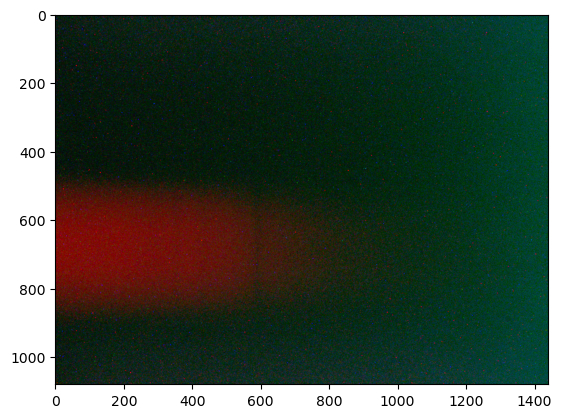

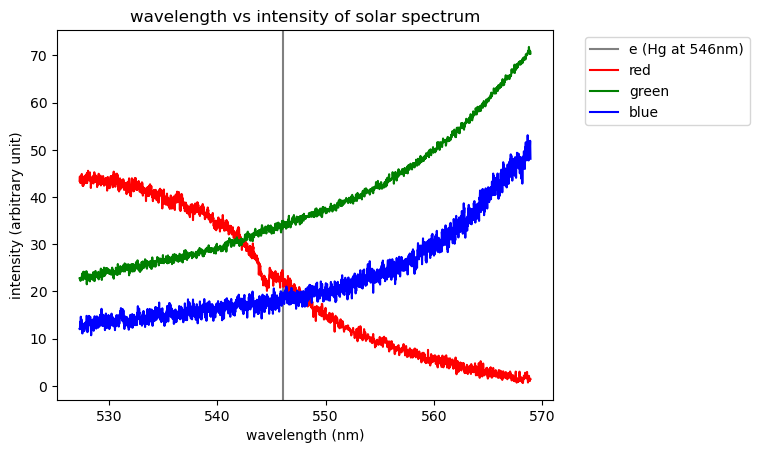

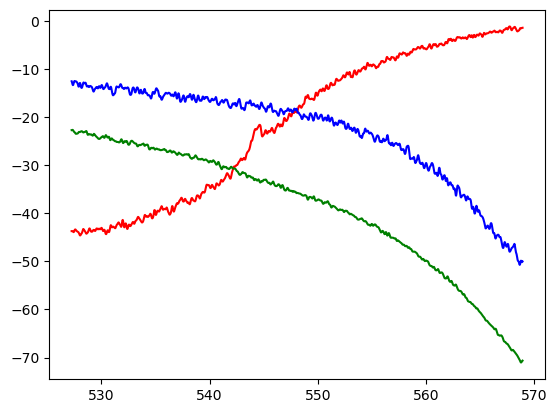

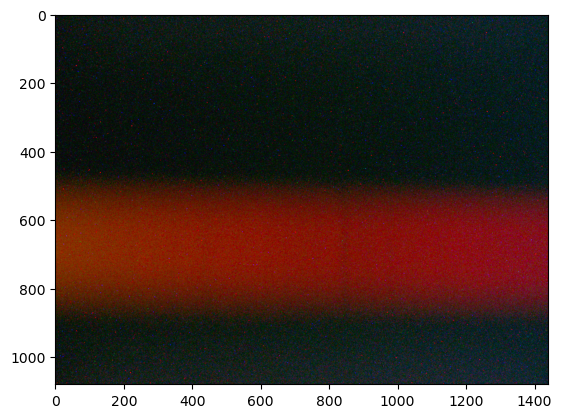

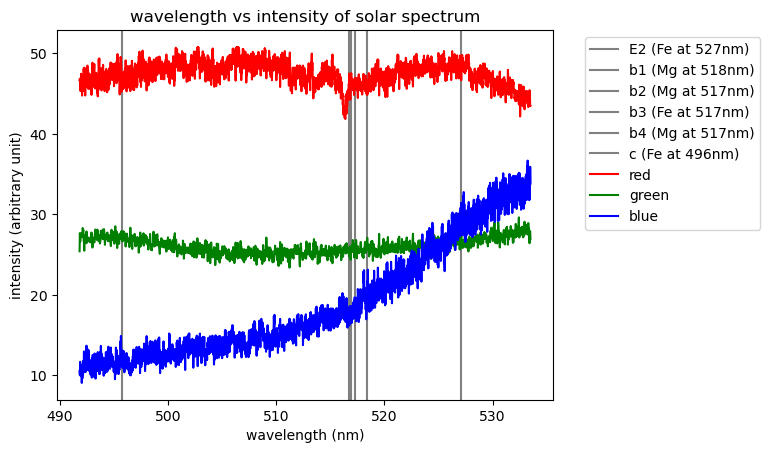

...

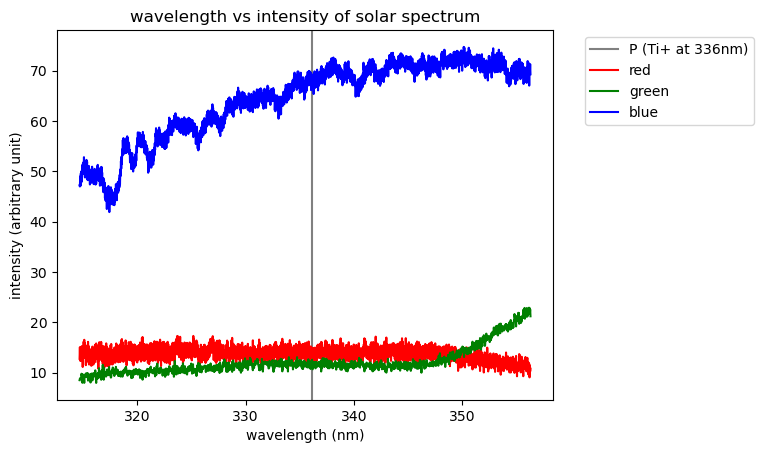

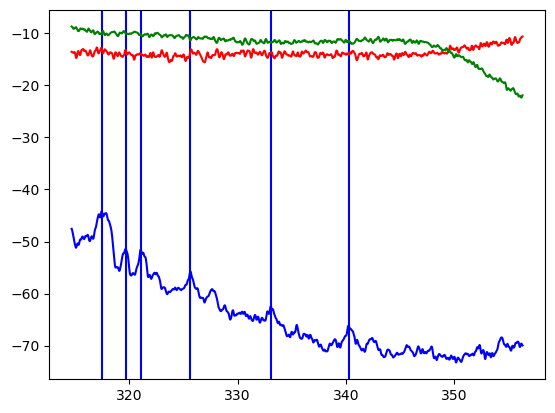

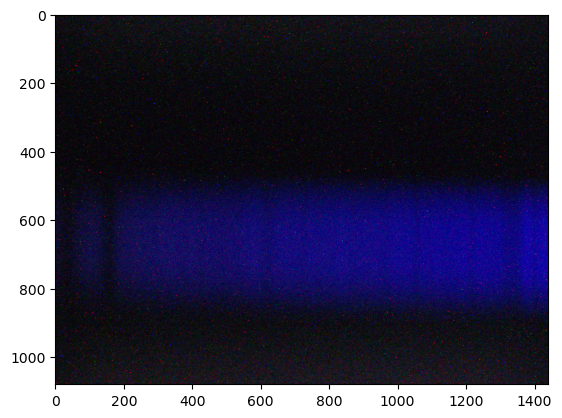

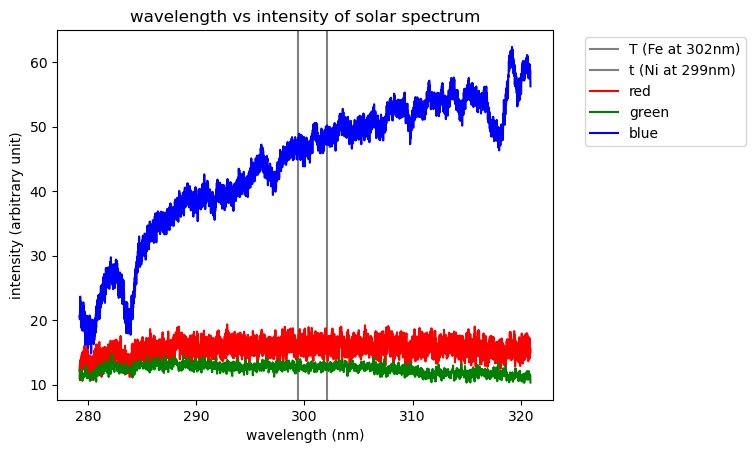

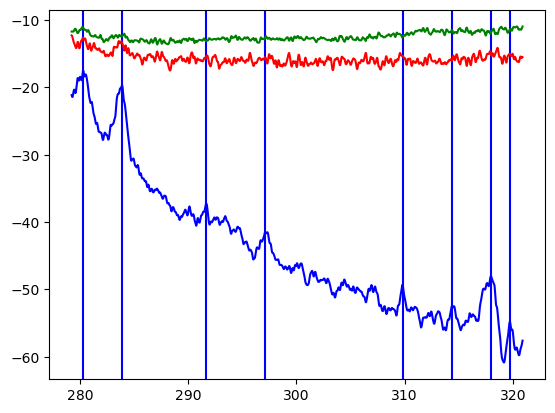

In [21]:
from scipy.ndimage import gaussian_filter
import os
import numpy as np
from scipy.signal import find_peaks

r_values = [68, 114, 160, 206, 252, 298, 344, 390, 436]

#r_values = [x - 180 for x in r_values]

#r_values = [x - 100 for x in r_values]

messung = 3

all_peaks = []

all_peaks_0 = []
all_peaks_1 = []
all_peaks_2 = []

for image_num in range(1, 9):
    image_name = f"{image_num:02d}.bmp"
    
    path = os.path.join('/Users/mreihs/Desktop/eth/praktikum_1/Spektroskopische_Messungen/c' + str(messung), image_name)
    image = read_bmp(path)

    
    plt.imshow(image)
    plt.show()
    

    image = average_image_normal(image)

    lambda_image = lambda_(np.arange(len(image)), r_values[image_num], image)

    # find the frauenhofer lines in the image
    for line_wavelength, line_name, line_element in frauhofer_lines_wavelengths:
        if line_wavelength > lambda_image[0] and line_wavelength < lambda_image[-1]:
            plt.axvline(line_wavelength, color='grey', label= line_name + " (" + line_element + " at " + str(round(line_wavelength)) + "nm)")
    
    plt.plot(lambda_image, image[:, 0], label='red', color='red')
    plt.plot(lambda_image, image[:, 1], label='green', color='green')
    plt.plot(lambda_image, image[:, 2], label='blue', color='blue')

    plt.ylabel('intensity (arbitrary unit)')
    plt.xlabel('wavelength (nm)')
    plt.legend()
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.title("wavelength vs intensity of solar spectrum")
    plt.show()

    # smooth image with gaussian filter
    sigma_val = 2

    image_0 = -gaussian_filter(image[:, 0], sigma=sigma_val)
    image_1 = -gaussian_filter(image[:, 1], sigma=sigma_val)
    image_2 = -gaussian_filter(image[:, 2], sigma=sigma_val)

    # find the peaks in the smoothed image
    prominence_val = 3

    peaks_0, _ = find_peaks(image_0, prominence=prominence_val)
    peaks_1, _ = find_peaks(image_1, prominence=prominence_val)
    peaks_2, _ = find_peaks(image_2, prominence=prominence_val)

    image_peaks = np.concatenate((peaks_0, peaks_1, peaks_2), axis=0)
    image_peaks = np.sort(image_peaks)

    
    for peak in image_peaks:
        all_peaks.append(lambda_image[peak])


    # draw vertical lines at the peaks and append the wavelengths to the list of all peaks
    for peak in peaks_0:
        plt.axvline(lambda_image[peak], color='red')
        all_peaks_0.append(lambda_image[peak])
    for peak in peaks_1:
        plt.axvline(lambda_image[peak], color='green')
        all_peaks_1.append(lambda_image[peak])
    for peak in peaks_2:
        plt.axvline(lambda_image[peak], color='blue')
        all_peaks_2.append(lambda_image[peak])

    plt.plot(lambda_image, image_0, label='red', color='red')
    plt.plot(lambda_image, image_1, label='green', color='green')
    plt.plot(lambda_image, image_2, label='blue', color='blue')
    plt.show()

all_peaks = np.sort(all_peaks)

In [38]:
# compare all_peaks to the expected peaks in frauhofer_lines_wavelengths
# find the shift between the two lists that produces the most matches
# a match is defined as a peak in all_peaks that is within 3nm of a peak in frauhofer_lines_wavelengths

shift_vals = np.arange(-500, 500, 1)
num_matches = []
threshold_match = 0.3

for shift in shift_vals:
    shifted_peaks = all_peaks + shift
    matches = 0
    for peak in shifted_peaks:
        for line_wavelength, line_name, line_element in frauhofer_lines_wavelengths:
            if np.abs(peak - line_wavelength) < threshold_match:
                matches += 1
                break
    num_matches.append(matches)



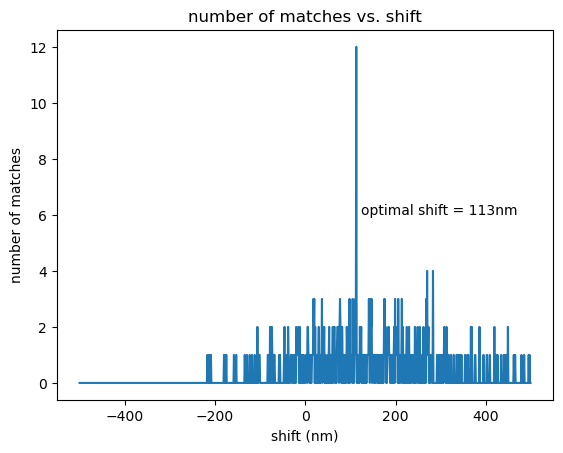

In [39]:
plt.title('number of matches vs. shift')
plt.plot(shift_vals, num_matches)
plt.xlabel('shift (nm)')
plt.ylabel('number of matches')
# label the maximum
max_index = np.argmax(num_matches)
plt.text(shift_vals[max_index] + 10, 6, f"optimal shift = {shift_vals[max_index]}nm")
plt.show()

# find the shift that produces the most matches
max_index = np.argmax(num_matches)
shift = shift_vals[max_index]

In [40]:
print('shift = ', shift)

# find matches for the shifted peaks
shifted_peaks = all_peaks + shift
shifted_peaks_0 = all_peaks_0 + shift
shifted_peaks_1 = all_peaks_1 + shift
shifted_peaks_2 = all_peaks_2 + shift

def get_matches(peaks, threshold_match, frauhofer_lines):
    matches = []
    matches_wavelengths = []
    for peak in peaks:
        for line_wavelength, line_name, line_element in frauhofer_lines:
            if np.abs(peak - line_wavelength) < threshold_match:
                matches.append(peak)
                matches_wavelengths.append(line_wavelength)
                break

    return matches, matches_wavelengths


matches, matches_wavelengths = get_matches(shifted_peaks, threshold_match, frauhofer_lines_wavelengths)
matches_0, matches_wavelengths_0 = get_matches(shifted_peaks_0, threshold_match, frauhofer_lines_wavelengths)
matches_1, matches_wavelengths_1 = get_matches(shifted_peaks_1, threshold_match, frauhofer_lines_wavelengths)
matches_2, matches_wavelengths_2 = get_matches(shifted_peaks_2, threshold_match, frauhofer_lines_wavelengths)

shift =  113


In [62]:
def fit_and_plot_gaussian(lambda_image, image, line_wavelength, isolated_peak_width, channel):
    # find the peak
    peak_index = np.argmin(np.abs(lambda_image - line_wavelength))
    peak = image[peak_index]
    # fit gaussian to isolated peak and get the central pixel position
    # we want to plot the gaussion on the whole image
    
    isolated_peak = -image[peak_index - isolated_peak_width: peak_index + isolated_peak_width]
    shift = np.min(isolated_peak)
    isolated_peak = isolated_peak - shift

    x_values = lambda_image[peak_index - isolated_peak_width: peak_index + isolated_peak_width]
    #plot a vertical line at the peak
    

    
    mu_lambda, sigma_lambda = fit_gaussian(x_values, isolated_peak)

    # plot isolated_peak and draw a vertical line at mu
    # plot the gaussian fit as well
    plt.axvline(mu_lambda, color='black', label="mean value of gaussian fit at " + str(round(line_wavelength)) + "nm")
    #plt.axvline(mu_lambda, color='red', label="mean value of gaussian fit at " + str(round(mu_lambda)) + "nm")
    #plot gaussian fit
    plt.plot(x_values, -gaussian(x_values, np.max(isolated_peak), mu_lambda, sigma_lambda) - shift, label="gaussian fit at " + str(round(line_wavelength)) + "nm", color="orange")

    return mu_lambda, sigma_lambda
    

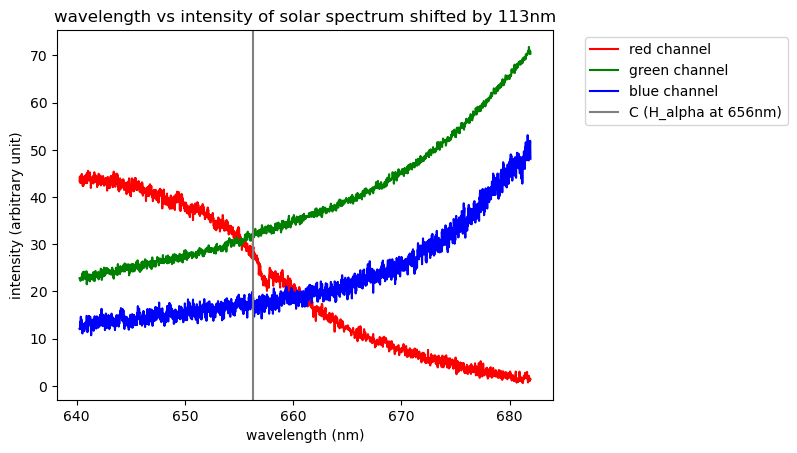

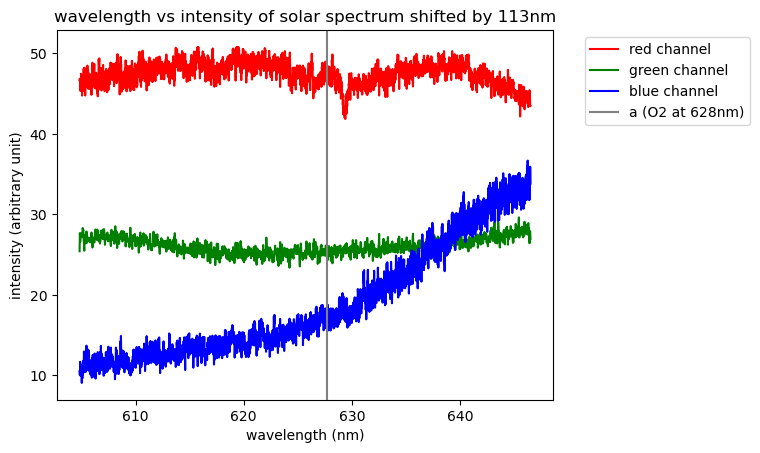

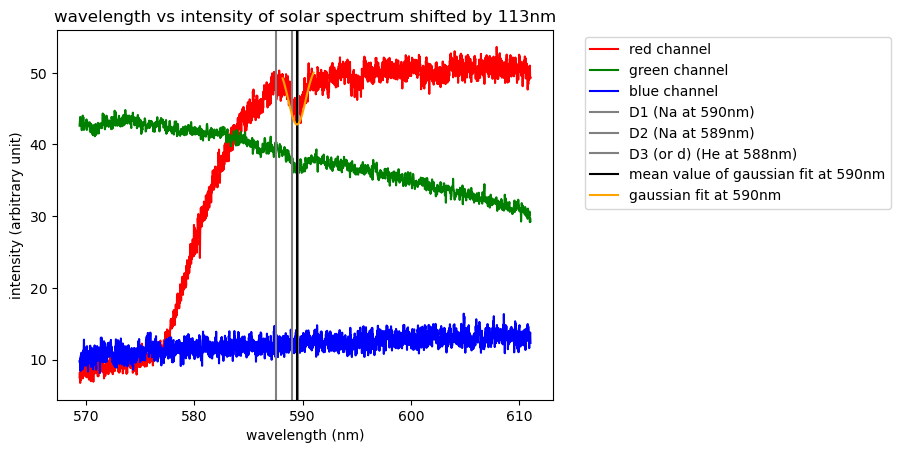

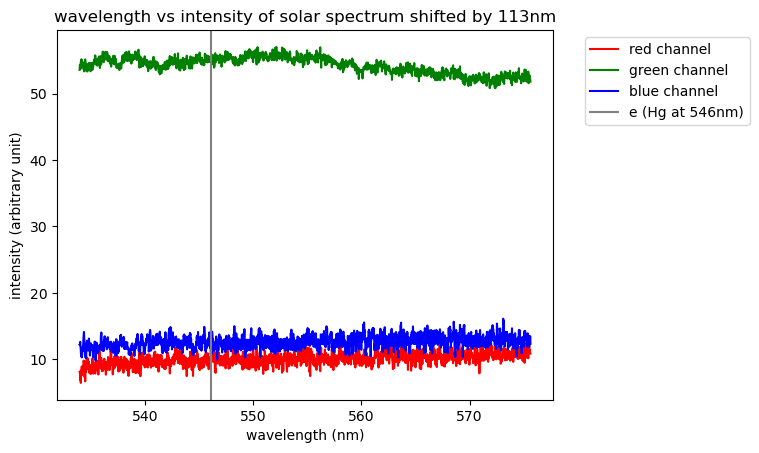

error


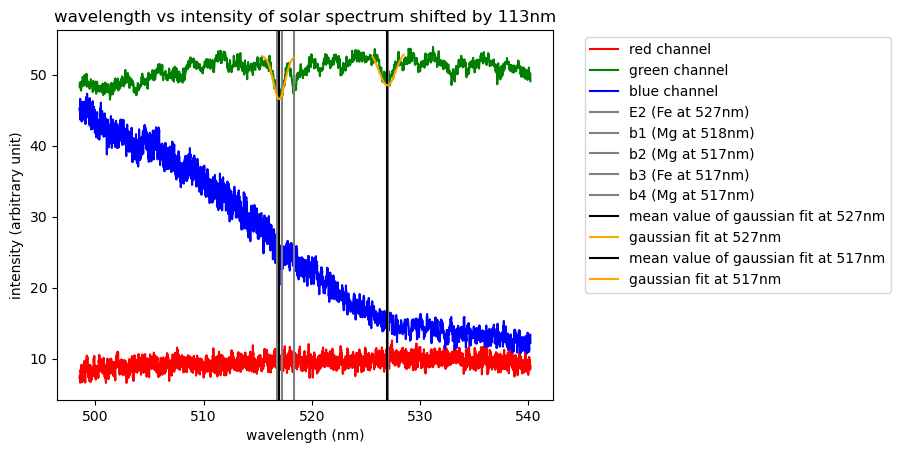

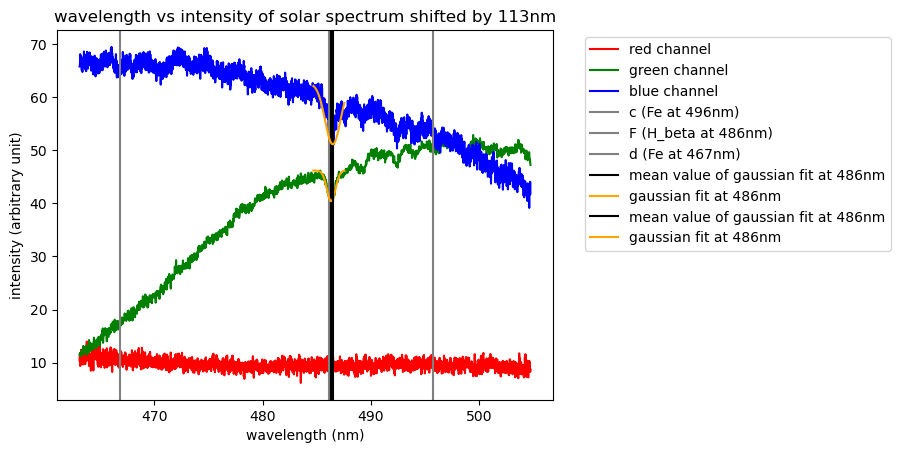

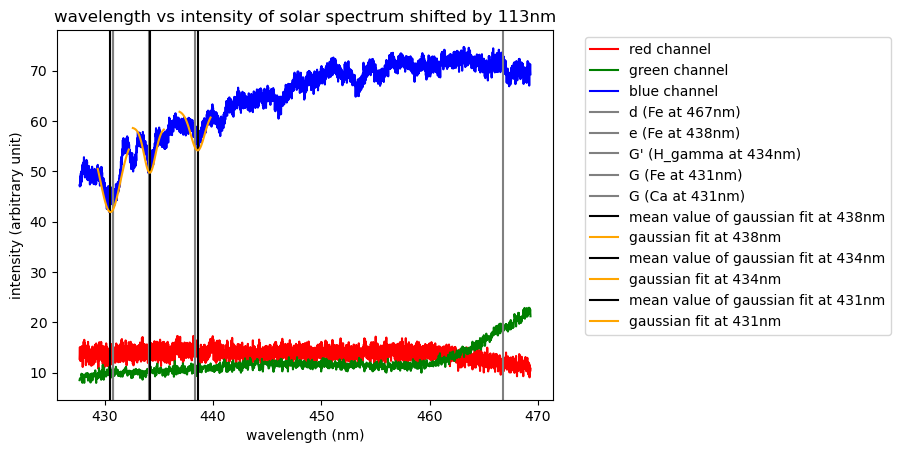

error


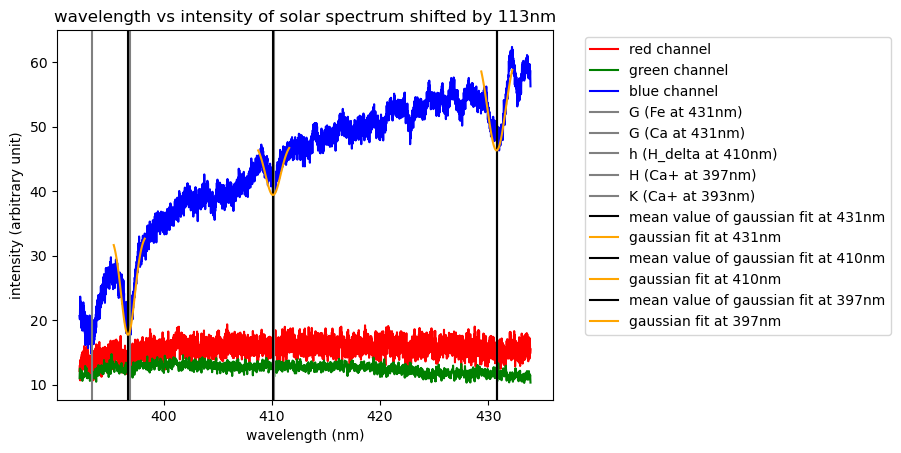

In [63]:
from scipy.ndimage import gaussian_filter
import os
import numpy as np
from scipy.signal import find_peaks

r_values = [68, 114, 160, 206, 252, 298, 344, 390, 436]

messung = 3
isolated_peak_width = 50

fitted_lambdas = []
fitted_sigmas = []

for image_num in range(1, 9):
    image_name = f"{image_num:02d}.bmp"
    
    path = os.path.join('/Users/mreihs/Desktop/eth/praktikum_1/Spektroskopische_Messungen/c' + str(messung), image_name)
    image = read_bmp(path)

    #plt.imshow(image)
    #plt.show()
    
    image = average_image_normal(image)

    lambda_image = lambda_(np.arange(len(image)), r_values[image_num], image) + shift

    plt.plot(lambda_image, image[:, 0], label='red channel', color='red')
    plt.plot(lambda_image, image[:, 1], label='green channel', color='green')
    plt.plot(lambda_image, image[:, 2], label='blue channel', color='blue')

    plt.ylabel('intensity (arbitrary unit)')
    plt.xlabel('wavelength (nm)')
    plt.title("wavelength vs intensity of solar spectrum shifted by " + str(shift) + "nm")

    for line_wavelength, line_name, line_element in frauhofer_lines_wavelengths:
        if line_wavelength > lambda_image[0] and line_wavelength < lambda_image[-1]:
            plt.axvline(line_wavelength, color='grey', label= line_name + " (" + line_element + " at " + str(round(line_wavelength)) + "nm)")
    

    # find the frauenhofer lines in the image
    for line_wavelength, line_name, line_element in frauhofer_lines_wavelengths:
        if line_wavelength > lambda_image[0] and line_wavelength < lambda_image[-1]:
            # if this line is a match, fit a gaussian to the peak
            # TODO
            if line_wavelength in matches_wavelengths_0:
                try:
                    mu_lambda, sigma_lambda = fit_and_plot_gaussian(lambda_image, image[:,0], line_wavelength, isolated_peak_width, 0)
                    fitted_lambdas.append(mu_lambda)
                    fitted_sigmas.append(sigma_lambda)
                except:
                    print("error")
                    pass
            if line_wavelength in matches_wavelengths_1:
                try:
                    mu_lambda, sigma_lambda = fit_and_plot_gaussian(lambda_image, image[:,1], line_wavelength, isolated_peak_width, 1)
                    fitted_lambdas.append(mu_lambda)
                    fitted_sigmas.append(sigma_lambda)
                except:
                    print("error")
                    pass
            if line_wavelength in matches_wavelengths_2:
                try:
                    mu_lambda, sigma_lambda = fit_and_plot_gaussian(lambda_image, image[:,2], line_wavelength, isolated_peak_width, 2)
                    fitted_lambdas.append(mu_lambda)
                    fitted_sigmas.append(sigma_lambda)
                except:
                    print("error")
                    pass
            
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()


In [54]:
print(lambda_(0, 0, image) - lambda_(0, 147, image))

113.2299023143222


In [59]:
# print all wavelengths of the matches
print('matches = ', matches)
print('matches_wavelengths = ', matches_wavelengths)

print(len(matches))
print(len(matches_wavelengths))

matches =  [393.3025830743723, 396.8927242405175, 410.1241316028429, 430.97011256755695, 434.0334230080659, 438.6369104711069, 486.40326898039143, 486.43222173173126, 516.942740442447, 518.3035197554213, 526.8445814006861, 589.5448783998306]
matches_wavelengths =  [393.366, 396.847, 410.175, 430.79, 434.047, 438.355, 486.134, 486.134, 516.891, 518.362, 527.039, 589.592]
12
12


In [60]:
# print fitted_lambdas and fitted_sigmas
print('fitted_lambdas = ', fitted_lambdas)
print('fitted_sigmas = ', fitted_sigmas)

fitted_lambdas =  [589.4842967013994, 526.9712975126776, 516.9763067810062, 486.3430814182401, 486.49148327580616, 438.577382600512, 434.15171591868966, 430.51862587956305, 430.7646377397874, 410.1064679238914, 396.7073036396712]
fitted_sigmas =  [0.7943157587817408, 0.7779907455082604, 0.5379270452334648, 0.3977485613778352, 0.7103847000931743, 0.6365585802790527, 0.5225210543608199, 0.9047151058254065, 0.8343829127947694, 0.7144421998043606, 0.6334503070729708]
